In [2100]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS


In [2101]:
df= pd.read_csv("experiments/data/customer_shopping_data.csv")
df=pd.DataFrame(df)

In [2102]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,invoice_date,shopping_mall
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,5/8/2022,Kanyon
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,12/12/2021,Forum Istanbul
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,9/11/2021,Metrocity
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,16/05/2021,Metropol AVM
4,I337046,C189076,Female,53,Books,4,60.60,Cash,24/10/2021,Kanyon


In [2103]:
df=df.rename(columns={"invoice_date":"Date","shopping_mall":"mall"})

In [2104]:
print("Number of Rows:",df.shape[0],"\nNumber of Columns:",df.shape[1])

Number of Rows: 99457 
Number of Columns: 10


In [2105]:
df.columns

Index(['invoice_no', 'customer_id', 'gender', 'age', 'category', 'quantity',
       'price', 'payment_method', 'Date', 'mall'],
      dtype='object')

In [2106]:
cat_cols=[]
num_cols=[]
for cols in df.columns:
    if(df[cols].dtype==object):
        cat_cols.append(cols)
    else:
        num_cols.append(cols)

In [2107]:
cat_cols

['invoice_no',
 'customer_id',
 'gender',
 'category',
 'payment_method',
 'Date',
 'mall']

In [2108]:
num_cols

['age', 'quantity', 'price']

In [2109]:
for cols in num_cols:
    print(df[cols].isnull().sum())
    

0
0
0


### Observations:
##### No missing data in the numerical columns

In [2110]:
for cols in cat_cols:
    print(df[cols].isnull().sum())
    

0
0
0
0
0
0
0


### Observations:
##### No missing data in the Categorical columns

In [2111]:
df[cat_cols].nunique()

invoice_no        99457
customer_id       99457
gender                2
category              8
payment_method        3
Date                797
mall                 10
dtype: int64

### Observation:
##### The above outputs provide us with the number of unique values in each column

In [2112]:
for cat in cat_cols:
    if(cat !="invoice_no" and cat !="customer_id" and cat != "Date"):
        val=df[cat].nunique()
        print(f"{cat}: {val} ",end='')
        print(df[cat].unique())

gender: 2 ['Female' 'Male']
category: 8 ['Clothing' 'Shoes' 'Books' 'Cosmetics' 'Food & Beverage' 'Toys'
 'Technology' 'Souvenir']
payment_method: 3 ['Credit Card' 'Debit Card' 'Cash']
mall: 10 ['Kanyon' 'Forum Istanbul' 'Metrocity' 'Metropol AVM' 'Istinye Park'
 'Mall of Istanbul' 'Emaar Square Mall' 'Cevahir AVM' 'Viaport Outlet'
 'Zorlu Center']


### Result:
##### Above are all the unique values for the Categorical Columns

In [2113]:
for col in cat_cols:
    if(col !="invoice_no" and col !="customer_id" and col != "Date"):
        print(df[col].value_counts())
        # print(f"here is the total count:{len(df[col].value_counts())}")
        print("======================")

gender
Female    59482
Male      39975
Name: count, dtype: int64
category
Clothing           34487
Cosmetics          15097
Food & Beverage    14776
Toys               10087
Shoes              10034
Souvenir            4999
Technology          4996
Books               4981
Name: count, dtype: int64
payment_method
Cash           44447
Credit Card    34931
Debit Card     20079
Name: count, dtype: int64
mall
Mall of Istanbul     19943
Kanyon               19823
Metrocity            15011
Metropol AVM         10161
Istinye Park          9781
Zorlu Center          5075
Cevahir AVM           4991
Forum Istanbul        4947
Viaport Outlet        4914
Emaar Square Mall     4811
Name: count, dtype: int64


### Observation:
##### Above are the count of the unique values present in each column

In [2114]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,Date,mall
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,5/8/2022,Kanyon
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,12/12/2021,Forum Istanbul
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,9/11/2021,Metrocity
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,16/05/2021,Metropol AVM
4,I337046,C189076,Female,53,Books,4,60.60,Cash,24/10/2021,Kanyon


In [2115]:
df['Date'] = pd.to_datetime(df['Date'],format='%d/%m/%Y', errors='raise')

In [2116]:
df['day'] = (df['Date']).dt.day
df['month'] = (df['Date']).dt.month
df['year'] = (df['Date']).dt.year

##### Splitting the Date column to separate Day , Month and Year column

In [2117]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,Date,mall,day,month,year
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,2022-08-05,Kanyon,5,8,2022
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,2021-12-12,Forum Istanbul,12,12,2021
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,2021-11-09,Metrocity,9,11,2021
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,2021-05-16,Metropol AVM,16,5,2021
4,I337046,C189076,Female,53,Books,4,60.60,Cash,2021-10-24,Kanyon,24,10,2021


#### Manually Encoding the month numbers to their respective names

In [2118]:
df.loc[(df['month'] ==1), 'month'] = 'January'
df.loc[(df['month'] ==2), 'month'] = 'February'
df.loc[(df['month'] ==3), 'month'] = 'March'
df.loc[(df['month'] ==4), 'month'] = 'April'
df.loc[(df['month'] ==5), 'month'] = 'May'
df.loc[(df['month'] ==6), 'month'] = 'June'
df.loc[(df['month'] ==7), 'month'] = 'July'
df.loc[(df['month'] ==8), 'month'] = 'August'
df.loc[(df['month'] ==9), 'month'] = 'September'
df.loc[(df['month'] ==10), 'month'] = 'October'
df.loc[(df['month'] ==11), 'month'] = 'November'
df.loc[(df['month'] ==12), 'month'] = 'December'

/tmp/ipykernel_162800/3057846671.py:1: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'January' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.



In [2119]:
df['month'].unique()

array(['August', 'December', 'November', 'May', 'October', 'March',
       'January', 'July', 'June', 'February', 'April', 'September'],
      dtype=object)

In [2120]:
df.month.value_counts()

month
January      11608
February     10482
March         8730
July          7877
October       7764
May           7697
December      7680
August        7635
June          7581
November      7563
April         7487
September     7353
Name: count, dtype: int64

### Observation:
##### The above result shows the number of shoppers in each month

In [2121]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,Date,mall,day,month,year
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,2022-08-05,Kanyon,5,August,2022
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,2021-12-12,Forum Istanbul,12,December,2021
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,2021-11-09,Metrocity,9,November,2021
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,2021-05-16,Metropol AVM,16,May,2021
4,I337046,C189076,Female,53,Books,4,60.60,Cash,2021-10-24,Kanyon,24,October,2021


In [2122]:

duplicate_customer_ids = df[df.duplicated('customer_id')]['customer_id']

if len(duplicate_customer_ids) > 0:
    print("Duplicate customer IDs found:")
    print(duplicate_customer_ids)
else:
    print("No duplicate customer IDs found.")


No duplicate customer IDs found.


##### No Duplicate customer ID

/tmp/ipykernel_162800/483403096.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




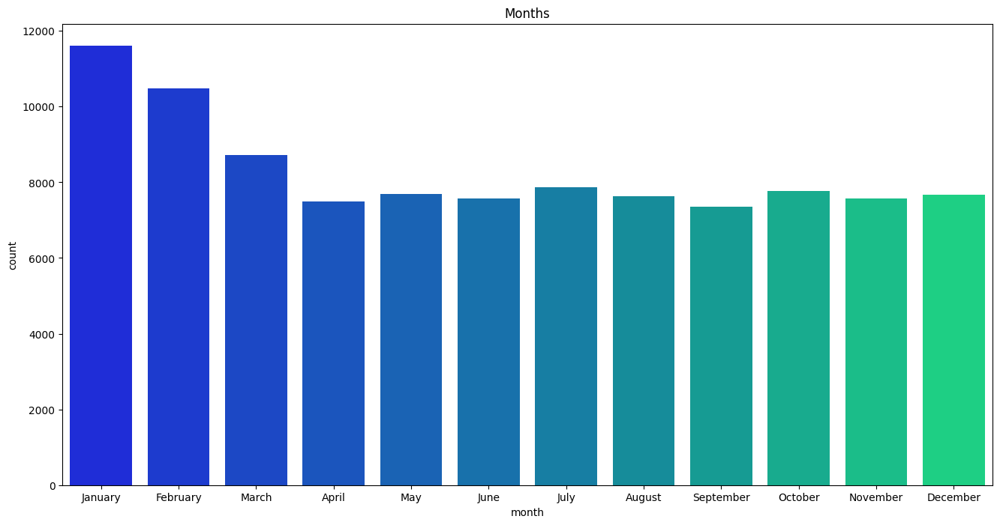

In [2123]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

plt.figure(figsize=(16, 8))
sns.countplot(x="month", data=df, order=month_order, palette="winter").set_title("Months") 

plt.show()

#### From the above plot it is evident that we see the maximum footfall of shoppers in the months of January, February and March.

/tmp/ipykernel_162800/1938920989.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




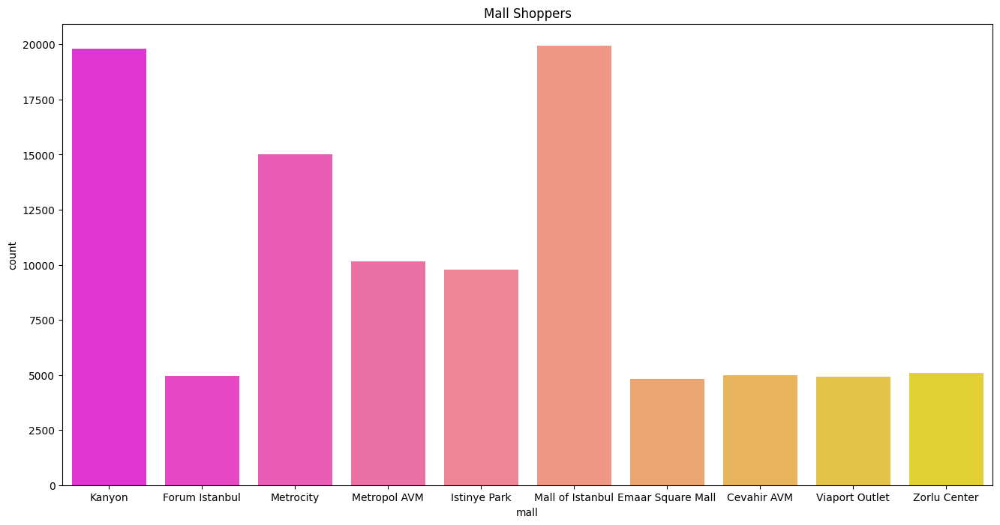

In [2124]:
plt.figure(figsize=(16, 8))
sns.countplot(x="mall", data =df,palette="spring").set_title("Mall Shoppers") 
plt.show()

#### From the above plot and below we can see that :
#### Mall of Instanbul and Kanyon see the maximum number of people comming for shopping followed by Metrocity

In [2125]:
fig = px.pie(df, values='price', names='mall')
fig.show()

In [2126]:
df.gender.value_counts()

gender
Female    59482
Male      39975
Name: count, dtype: int64

#### The below plot shows that more Women come to shop than Men

In [2127]:
fig = px.pie(df, values='price', names='gender')
fig.show()

In [2128]:
df.category.value_counts()

category
Clothing           34487
Cosmetics          15097
Food & Beverage    14776
Toys               10087
Shoes              10034
Souvenir            4999
Technology          4996
Books               4981
Name: count, dtype: int64

/tmp/ipykernel_162800/1462309904.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




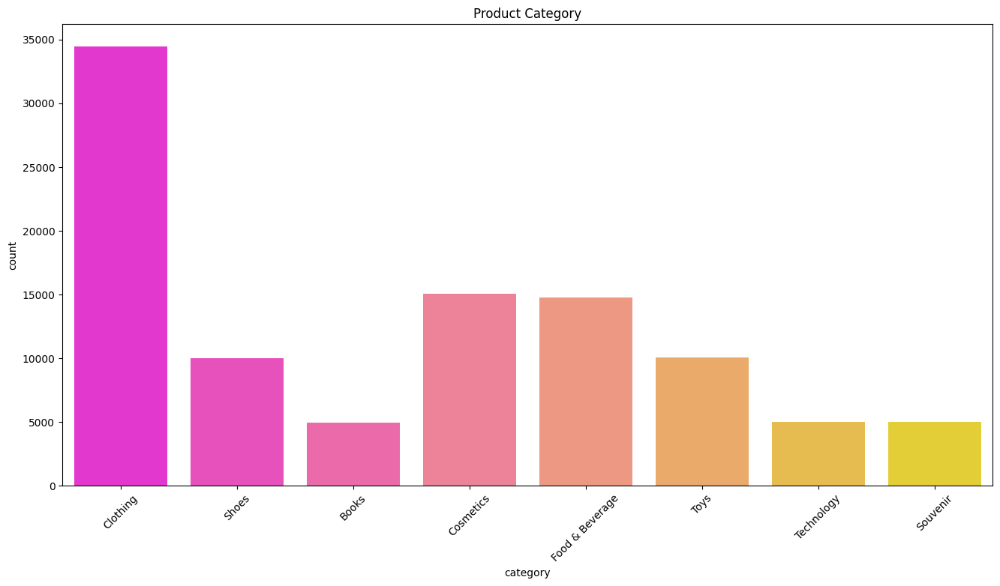

In [2129]:
plt.figure(figsize=(16, 8))
sns.countplot(x="category", data =df,palette="spring").set_title("Product Category") 
plt.xticks(rotation=45)
plt.show()

### Results from the above plot:
#### Clothing accounts for the most customer sales, Books, Technology and Souvenir account for the least
#### Now low count on this plot doesn't mean that the product is not selling well for example Technology products are expensive so they can bring in more money by even selling a smaller number of products

In [2130]:
fig = px.pie(df, values='price', names='category')
fig.show()

#### The above plot suggests that Clothing brings in the largest portion of money through sales followed by Shoes and Technology. 
#### Look as I said before in the previous plot Technology products being more epensive bring in the 3rd most amount of money even though they had such a low share in the count plot.

In [2131]:
fig = px.pie(df, values='quantity', names='category')
fig.show()

#### Based on the quantity of products sold Clothing again has the highest share among all the categories, followed by Cosmetics and Food and Beverages
#### Mind you this is the quantity of a product from the category bought and not the number of customers that buy the specific product

In [2132]:
df.quantity.value_counts()


quantity
3    20149
5    19990
2    19828
1    19767
4    19723
Name: count, dtype: int64

In [2133]:
df.payment_method.value_counts()

payment_method
Cash           44447
Credit Card    34931
Debit Card     20079
Name: count, dtype: int64

/tmp/ipykernel_162800/927183384.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




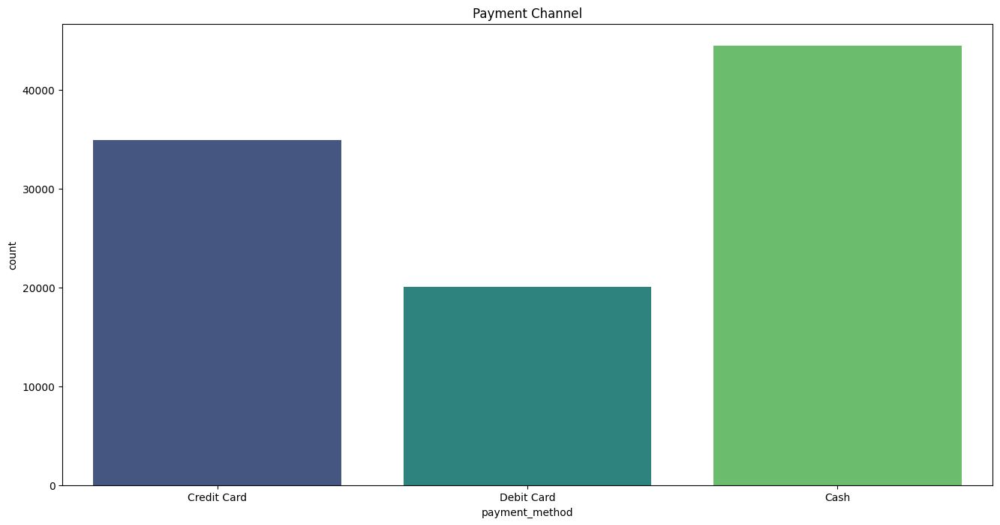

In [2134]:
plt.figure(figsize=(16, 8))
sns.countplot(x="payment_method", data =df,palette="viridis").set_title("Payment Channel") 
plt.show()

#### From above plot it is quite evident that Cash is the most preferred mode of payment followed by Credit Card and Debit Card.                       Haaaa? No UPI,  so weird..

In [2135]:
payment_price_stats = df.groupby('payment_method')['price'].mean()

print("Mean Price for Each Payment Method:")
print(payment_price_stats)

Mean Price for Each Payment Method:
payment_method
Cash           690.823475
Credit Card    688.542467
Debit Card     687.029135
Name: price, dtype: float64


#### Checking the correlation of payment methods with expenditure in order to find out if customers from any specific payment method spend more or not.

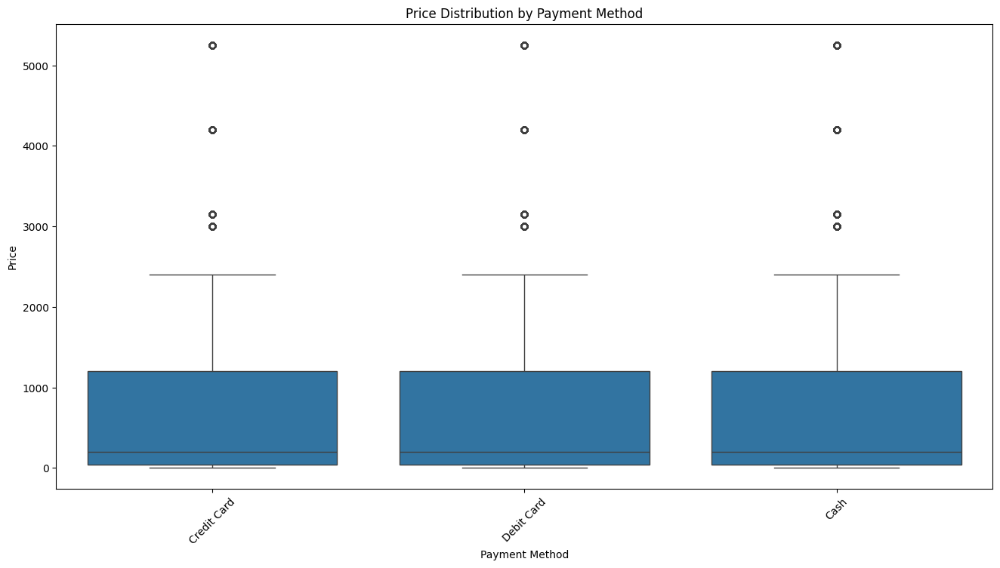

In [2136]:

plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='payment_method', y='price')
plt.title('Price Distribution by Payment Method')
plt.xlabel('Payment Method')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.show()


In [2137]:

payment_category_counts = df.groupby(['payment_method', 'category']).size().unstack(fill_value=0)

print("Counts of Transactions for Each Combination of Payment Method and Category:")
print(payment_category_counts)

Counts of Transactions for Each Combination of Payment Method and Category:
category        Books  Clothing  Cosmetics  Food & Beverage  Shoes  Souvenir  \
payment_method                                                                 
Cash             2268     15456       6674             6587   4474      2211   
Credit Card      1696     12025       5336             5250   3553      1770   
Debit Card       1017      7006       3087             2939   2007      1018   

category        Technology  Toys  
payment_method                    
Cash                  2235  4542  
Credit Card           1753  3548  
Debit Card            1008  1997  


#### Above result show the correlation of the product cateogries with the payment method in order to see any trend in this regard.

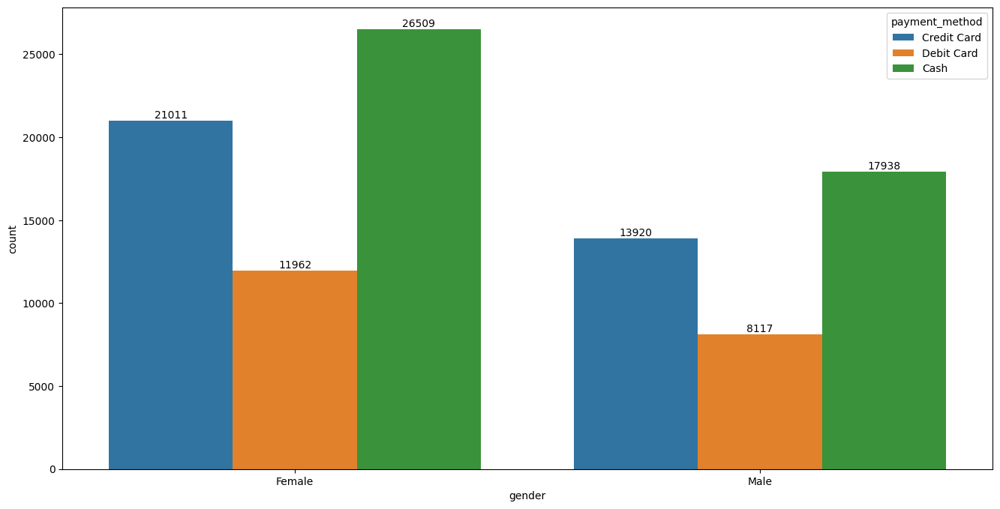

In [2138]:
plt.figure(figsize=(16, 8))
count_plot(x_axis = "gender", hue = "payment_method")

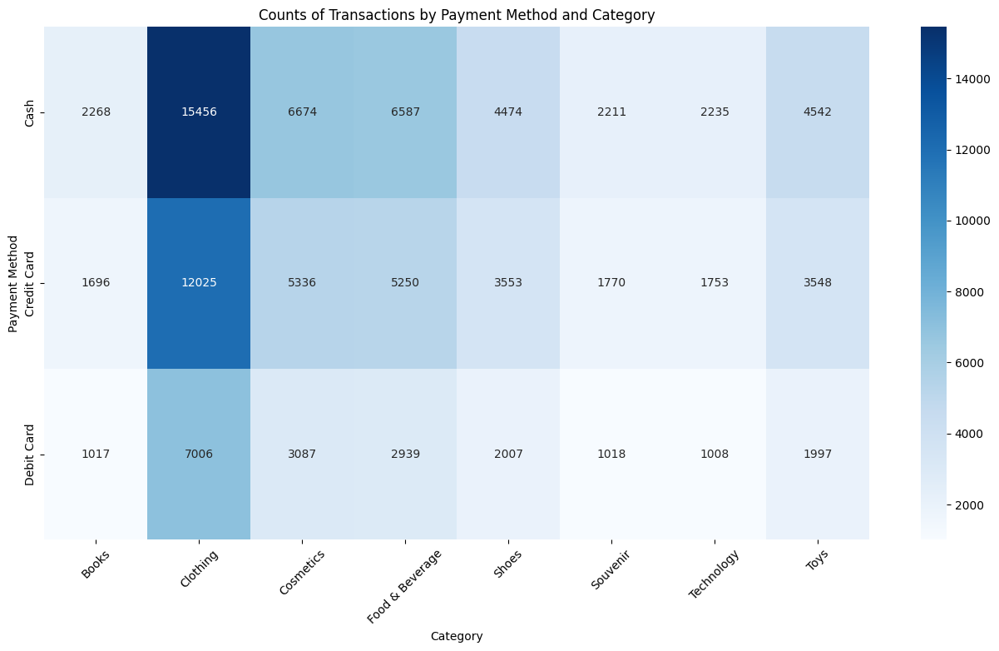

In [2139]:

plt.figure(figsize=(16, 8))
sns.heatmap(payment_category_counts, cmap='Blues', annot=True, fmt='d')
plt.title('Counts of Transactions by Payment Method and Category')
plt.xlabel('Category')
plt.ylabel('Payment Method')
plt.xticks(rotation=45)
plt.show()


#### Both Men and Women prefer Cash as the most used form of payment which is followed by Credit Card and Debit Card

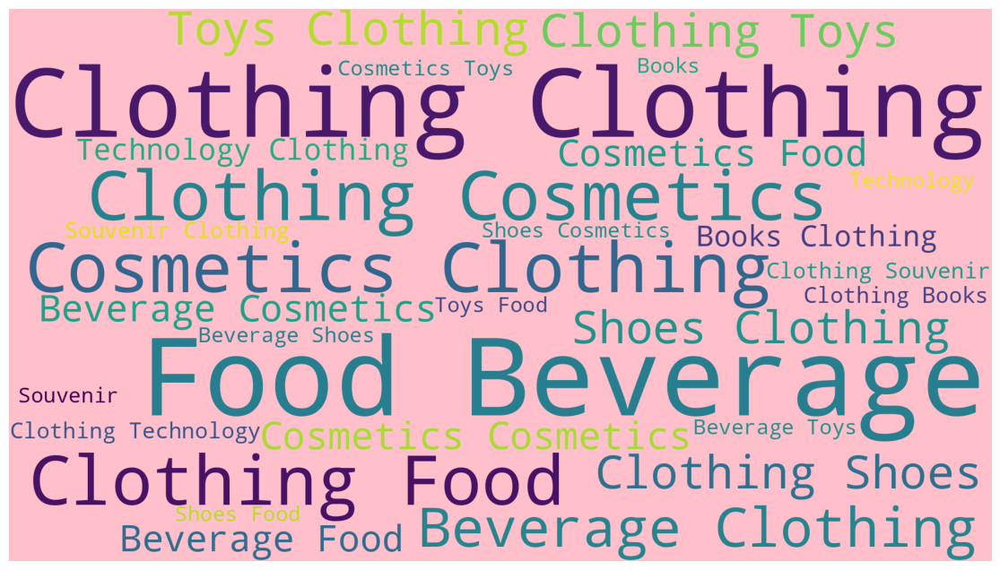

In [2140]:
plt.subplots(figsize=(20,8))
wordcloud = WordCloud(background_color='pink',width=1920,height=1080).generate(" ".join(df['category']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

### Just a fun Word Cloud...

/tmp/ipykernel_162800/2814282984.py:2: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




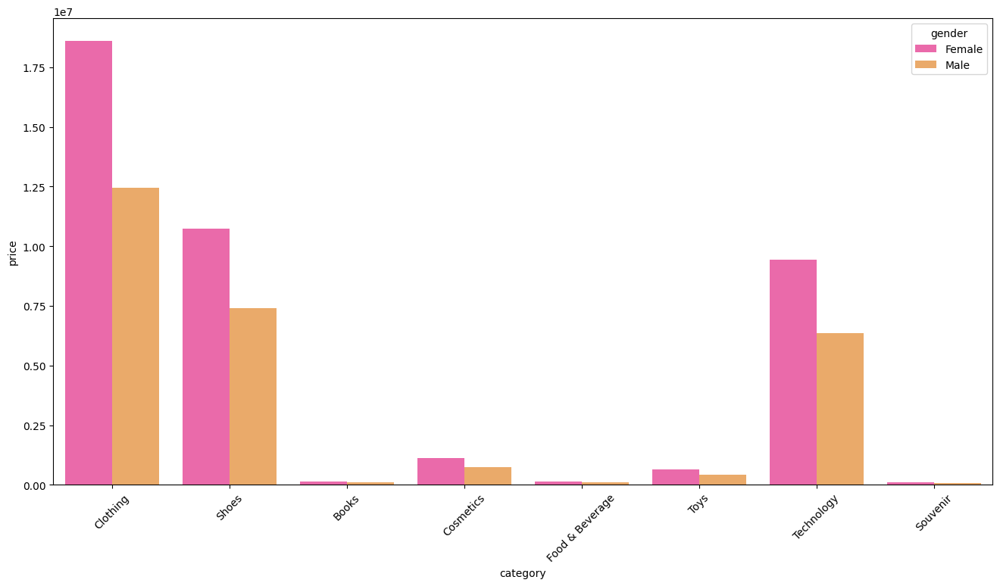

In [2141]:

plt.figure(figsize=(16,8))
sns.barplot(x='category', y = 'price', hue = 'gender', data = df, estimator = sum, ci = None,palette="spring")
plt.xticks(rotation=45)
plt.show()


### Women are the top spenders in each category of products

In [2142]:
def count_plot(x_axis, hue = None, rotation = 0):
 
    graph = sns.countplot(x = x_axis, data = df, hue = hue, order = df[x_axis].value_counts().index)
    for container in graph.containers:
        graph.bar_label(container)
        
        
    plt.xticks(rotation = rotation)
    plt.show()



def box_plot(x_axis = None, y_axis = None, hue = None, col = None):

    sns.catplot(x = x_axis, y = y_axis, data = df, hue = hue, kind = "box", col = col)
    plt.xlabel(x_axis)
    plt.ylabel("FRQ")
    plt.show()

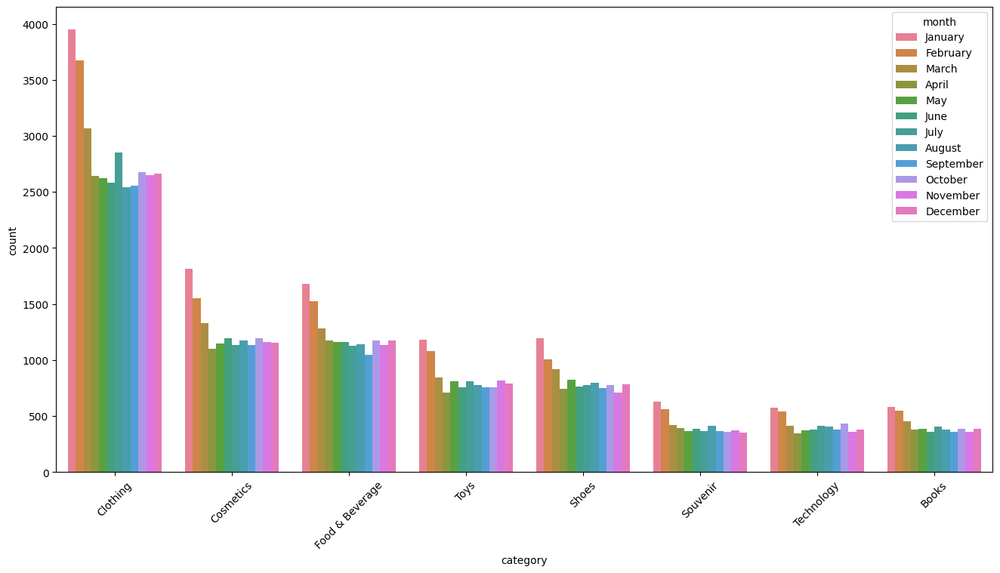

In [2143]:
plt.figure(figsize=(16, 8))

def count_plot_month(x_axis, hue, rotation=0):
 
    month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
    
   
    graph = sns.countplot(x=x_axis, data=df, hue=hue, order=df[x_axis].value_counts().index, hue_order=month_order)

    plt.xticks(rotation=rotation)
    
    plt.show()


count_plot_month(x_axis="category", hue="month", rotation=45)

### Above is the month-wise count of sales of each category of products

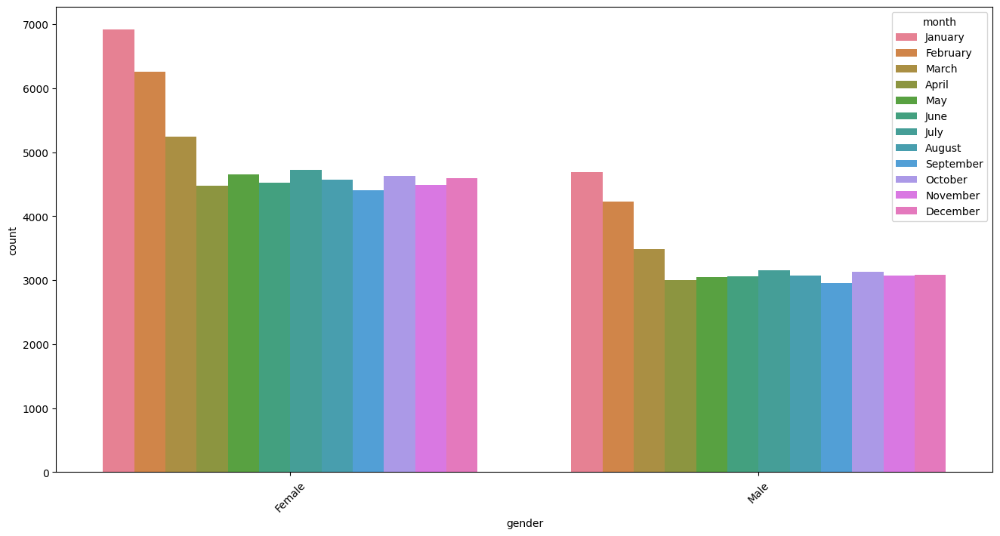

In [2144]:
# count_plot(x_axis = "gender", hue = "month")
plt.figure(figsize=(16, 8))

count_plot_month(x_axis="gender", hue="month", rotation=45)

### Above is the month-wise footfall of Female and Male customers

/tmp/ipykernel_162800/1457047822.py:3: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



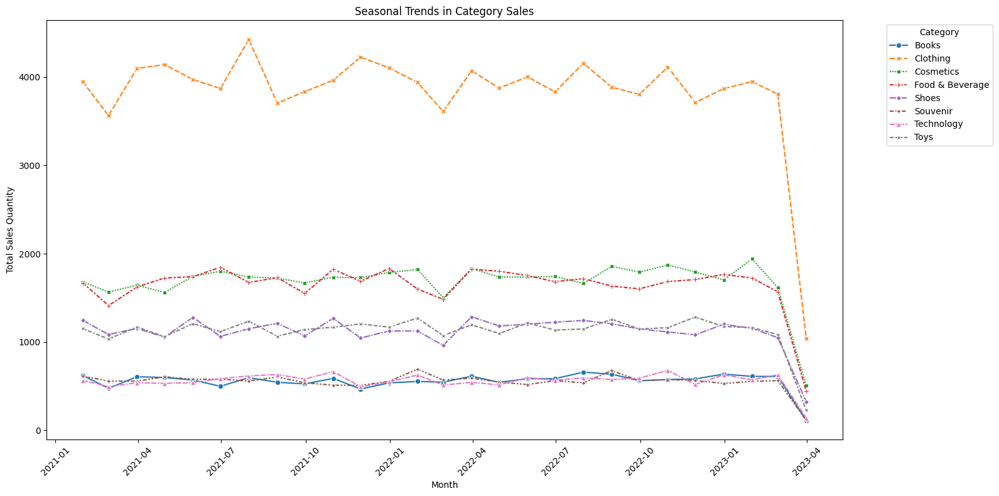

In [2145]:

df.set_index('Date', inplace=True)

category_sales = df.groupby([pd.Grouper(freq='M'), 'category'])['quantity'].sum().unstack()

plt.figure(figsize=(16, 8))
sns.lineplot(data=category_sales, markers=True)
plt.title('Seasonal Trends in Category Sales')
plt.xlabel('Month')
plt.ylabel('Total Sales Quantity')
plt.xticks(rotation=45)
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


#### Above is the Seasonal Trends in the sale of the different Category of products available. There are no shift in product trend ie. no new emerging product category is seen.

## Discussion

#### Q: How does shopping differ between genders in terms of quantity purchased and total amount spent? 
Ans: It is quite obvious from our above observations that the Women not only have a hogher number of quantity purchased but also spend more amount of money in the overall shopping

##### Q: Are there any noticeable trends in the types of products purchased by each gender?
Ans: No, there aren't any noticable trends in the tpyes of products based just on the gender. After all our plots there is inconclusive evidence to prove any trend.

#### Q: Do certain months see higher sale volumes ?
Ans: Yes, months like January, February and March have a higher volume of sale of products

#### Q:  Which product categories are most popular among customers?
Ans: The clothing category was especially popular among customers, as it is a necessity for all people. Moreover we even notices that Shoes was also a category which was popular among customers.

#### Q: Can we identify any emerging trends or shifts in category preferences over time?
Ans: Sadly no new emerging trends or shifts in category preferencws were noticed over the period of time.

#### Q: What are the most commonly used payment methods among customers?
Ans: Cash was the most preferred mode of payment among customers, closely followed by Credit card and lastly Debit card.

#### Q: Are there any correlations between payment methods and spending habits?
Ans: No, from the above observations it is clear that all the payment methods amount to a similar expenditure by the customer.

#### Q: Do certain payment methods correlate with specific product categories or demographics?
Ams: Yes, it is noticable that customers that pay with cash have a affinity to spend money on CLothing.

#### Q:  Are there any frequent or high-value customers who contribute significantly to overall sales?
Ans: No duplicate customer_id was found in the dataset so that mean there is no frequent customer.

#### Ans: Implementing strategies to retain loyal customers and increase customer lifetime value is essential for the long-term success of any business. Here are some effective strategies to achieve this goal:

#### 1. ***Loyalty Programs***: Implement a loyalty program that rewards customers for their repeat purchases. Offer incentives such as discounts, exclusive offers, or points-based rewards for every purchase, encouraging customers to return and make additional purchases.
#### 2. ***Personalized Marketing***: Use data analytics and customer segmentation techniques to personalize marketing campaigns and offers based on individual customer preferences, purchase history, and behavior. Tailored communication and promotions make customers feel valued and increase their likelihood of making repeat purchases.
#### 3. ***Exceptional Customer Service***: Provide exceptional customer service and support at every touchpoint, including pre-sale inquiries, post-purchase assistance, and issue resolution. Positive customer experiences build trust and loyalty, leading to repeat business and positive word-of-mouth referrals.

#### Q: Are there any products that consistently sell out or experience high demand?
Ans: Yes, Clothing and Shoes see high demand very likely sell out.
